## Задание 3. Глубокое обучение в компьютерном зрении.

Обучить СНС с помощью Transfer Learning на датасете Food-101
Использовать тонкую настройку существующей предобученной модели и методы аугментации данных.

Библиотеки: [Python, Tensorflow]

In [6]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np

import tensorflow as tf
import tensorflow_datasets as tfds

from tensorflow.keras import layers

### Загрузка датасета Food-101

In [2]:
tfds.disable_progress_bar()
(train_ds, test_ds), ds_info = tfds.load(
    'food101', 
    as_supervised=True,
    with_info=True,
    split=['train[:90%]', 'train[90%:]'],
)

Dataset food101 downloaded and prepared to ~/tensorflow_datasets/food101/2.0.0. Subsequent calls will reuse this data.


### Визуализация датасета Food-101

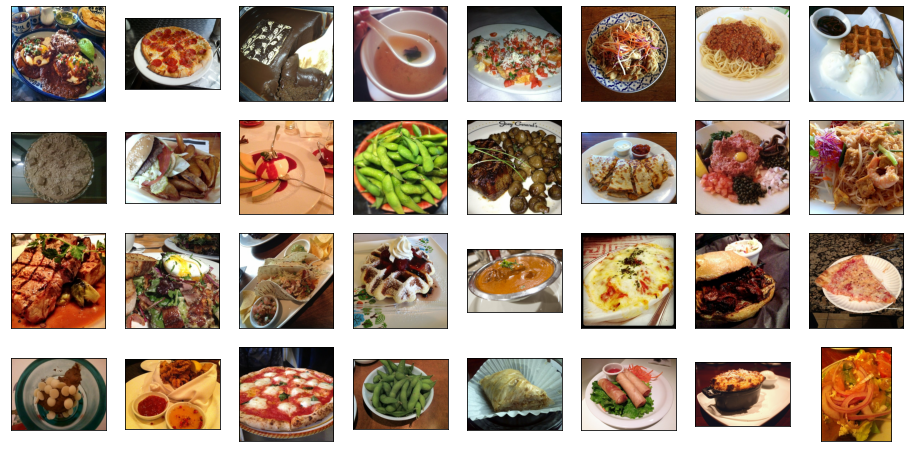

In [3]:
some_samples = [x[0] for x in iter(train_ds.take(32))]

fig = plt.figure(figsize=(16, 8))
for j in range(len(some_samples)):
    ax = fig.add_subplot(4, 8, j+1)
    ax.imshow(some_samples[j])
    plt.xticks([]), plt.yticks([])
plt.show()

### Создание пайплайна данных

In [4]:
INP_SIZE = 224
NUM_EPOCHS = 5
BATCH_SIZE = 64

def prepare(img, label):
    img = tf.cast(img, tf.float32)/127. - 1.
    return tf.image.resize(img, (INP_SIZE, INP_SIZE)), label

train_ds = train_ds.shuffle(buffer_size=1000)
train_ds = train_ds.map(prepare)
train_ds = train_ds.batch(BATCH_SIZE, drop_remainder=True)

test_ds = test_ds.shuffle(buffer_size=1000)
test_ds = test_ds.map(prepare)
test_ds = test_ds.batch(128, drop_remainder=True)

### Подготовка модели CNN

In [7]:
base_model = tf.keras.applications.MobileNetV2(
    input_shape=(INP_SIZE, INP_SIZE, 3),
    include_top=False,
    weights='imagenet', 
)
base_model.trainable = True

data_augmentation = tf.keras.Sequential([
    layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
    layers.experimental.preprocessing.RandomRotation((-0.2, 0.2)),
])

model = tf.keras.Sequential([
    tf.keras.layers.InputLayer(input_shape=(INP_SIZE, INP_SIZE, 3)),
    data_augmentation,
    base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(101, activation='softmax'),
])

### Подготовка к обучению

In [8]:
LEARNING_RATE = 0.0001
optimizer = tf.keras.optimizers.Adam(lr=LEARNING_RATE)

model.compile(optimizer=optimizer,
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

tensorboard_callback = tf.keras.callbacks.TensorBoard(
    log_dir='logs/', 
    write_graph=False, update_freq=100, profile_batch=0)

/usr/local/lib/python3.7/dist-packages/keras/optimizers/optimizer_v2/adam.py:110: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


### Model Summary

In [9]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 224, 224, 3)       0         
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 7, 7, 1280)       2257984   
 ional)                                                          
                                                                 
 global_average_pooling2d (G  (None, 1280)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 101)               129381    
                                                                 
Total params: 2,387,365
Trainable params: 2,353,253
Non-trainable params: 34,112
_________________________________________________________________


### Обучение модели

In [10]:
%%time

history = model.fit(
    train_ds,
    epochs=NUM_EPOCHS,
    validation_data=test_ds,
    callbacks=[tensorboard_callback])

Epoch 1/5
1065/1065 [==============================] - 559s 510ms/step - loss: 2.2951 - accuracy: 0.4497 - val_loss: 1.9002 - val_accuracy: 0.5218
Epoch 2/5
1065/1065 [==============================] - 548s 513ms/step - loss: 1.4077 - accuracy: 0.6340 - val_loss: 1.5963 - val_accuracy: 0.5914
Epoch 3/5
1065/1065 [==============================] - 546s 511ms/step - loss: 1.1720 - accuracy: 0.6902 - val_loss: 1.4355 - val_accuracy: 0.6312
Epoch 4/5
1065/1065 [==============================] - 546s 512ms/step - loss: 1.0231 - accuracy: 0.7250 - val_loss: 1.4202 - val_accuracy: 0.6364
Epoch 5/5
1065/1065 [==============================] - 542s 508ms/step - loss: 0.9206 - accuracy: 0.7515 - val_loss: 1.3065 - val_accuracy: 0.6639
CPU times: user 53min 10s, sys: 2min 46s, total: 55min 56s
Wall time: 46min 31s


### Оценка качества модели

In [11]:
%%time

model.evaluate(test_ds)

59/59 [==============================] - 19s 309ms/step - loss: 1.3087 - accuracy: 0.6634
CPU times: user 36 s, sys: 1.31 s, total: 37.3 s
Wall time: 20.5 s


[1.3087040185928345, 0.663400411605835]

### Запуск предсказания на изображении из интернета

In [12]:
import imageio
from skimage.transform import resize

def prepare_image(img):
    img = img.astype(np.float32)/127. - 1.
    img = resize(img, (INP_SIZE, INP_SIZE), order=3, mode='reflect', anti_aliasing=True)
    return img.astype(np.float32)

--2022-10-23 17:15:37--  https://www.gastronom.ru/binfiles/images/20150224/beb3eff4.jpg
Resolving www.gastronom.ru (www.gastronom.ru)... 178.248.238.173
Connecting to www.gastronom.ru (www.gastronom.ru)|178.248.238.173|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 69449 (68K) [image/jpeg]
Saving to: ‘beb3eff4.jpg.1’

beb3eff4.jpg.1      100%[===================>]  67.82K   234KB/s    in 0.3s    

2022-10-23 17:15:39 (234 KB/s) - ‘beb3eff4.jpg.1’ saved [69449/69449]



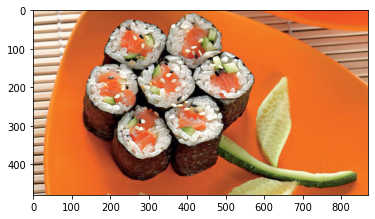

In [14]:


!wget https://www.gastronom.ru/binfiles/images/20150224/beb3eff4.jpg

img = imageio.imread('beb3eff4.jpg', pilmode="RGB")
plt.imshow(img)
img = prepare_image(img)

In [15]:
pred = model(img[None, ...], training=False)
ds_info.features['label'].int2str(np.argmax(pred.numpy()[0]))

'sushi'

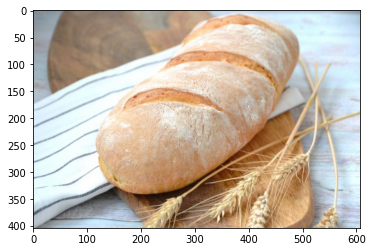

In [19]:
img = imageio.imread('bread.JPG', pilmode="RGB")
plt.imshow(img)
img = prepare_image(img)

In [20]:
pred = model(img[None, ...], training=False)
ds_info.features['label'].int2str(np.argmax(pred.numpy()[0]))

'breakfast_burrito'

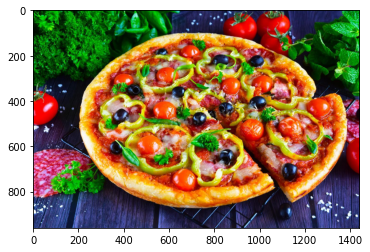

In [22]:
img = imageio.imread('pizza.jpg', pilmode="RGB")
plt.imshow(img)
img = prepare_image(img)

In [23]:
pred = model(img[None, ...], training=False)
ds_info.features['label'].int2str(np.argmax(pred.numpy()[0]))

'pizza'

In [25]:
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>